In [3]:
import pandas as pd
import numpy as np
import re
from datetime import datetime
import ast
from collections import Counter

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MultiLabelBinarizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import classification_report, accuracy_score
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
import xgboost as xgb
from sklearn.feature_selection import SelectKBest, chi2
from imblearn.over_sampling import RandomOverSampler

import warnings
warnings.filterwarnings('ignore')

dtypes = {
    'name': 'category',
    'short_description': 'string',
    'long_description': 'string',
    'genres': 'string',
    'minimum_system_requirement': 'string',
    'recommend_system_requirement': 'string',
    'release_date': 'string',
    'developer': 'string',
    'publisher': 'string',
    'overall_player_rating': 'string',
    'number_of_reviews_from_purchased_people': 'string',
    'number_of_english_reviews': 'string',
    'link': 'string'
}

df = pd.read_csv('steam5.csv', dtype=dtypes, low_memory=True)

def parse_list_field(field):
    try:
        return ast.literal_eval(field)
    except (ValueError, SyntaxError):
        return []

df['genres'] = df['genres'].apply(parse_list_field)
df['developer'] = df['developer'].apply(parse_list_field)
df['publisher'] = df['publisher'].apply(parse_list_field)

def parse_number_field(x):
    if pd.isnull(x):
        return 0
    x = re.sub(r'[\(\),]', '', x)
    x = x.replace(',', '')
    try:
        return int(x)
    except ValueError:
        return 0

df['number_of_reviews_from_purchased_people'] = df['number_of_reviews_from_purchased_people'].apply(parse_number_field)
df['number_of_english_reviews'] = df['number_of_english_reviews'].apply(parse_number_field)

def parse_date(date_str):
    try:
        return datetime.strptime(date_str, '%d %b, %Y')
    except ValueError:
        try:
            return datetime.strptime(date_str, '%b %Y')
        except ValueError:
            return pd.NaT

df['release_date'] = df['release_date'].apply(parse_date)

valid_ratings = [
    'Overwhelmingly Positive', 'Very Positive', 'Mostly Positive', 'Positive',
    'Mixed', 'Negative', 'Mostly Negative', 'Very Negative', 'Overwhelmingly Negative'
]
df = df[df['overall_player_rating'].isin(valid_ratings)]

rating_mapping = {
    'Overwhelmingly Positive': 'Positive',
    'Very Positive': 'Positive',
    'Mostly Positive': 'Positive',
    'Positive': 'Positive',
    'Mixed': 'Mixed',
    'Mostly Negative': 'Negative',
    'Negative': 'Negative',
    'Very Negative': 'Negative',
    'Overwhelmingly Negative': 'Negative'
}

df['overall_player_rating'] = df['overall_player_rating'].map(rating_mapping)

class_counts = df['overall_player_rating'].value_counts()
print("After merged:")
print(class_counts)

le_rating = LabelEncoder()
df['overall_player_rating_encoded'] = le_rating.fit_transform(df['overall_player_rating'])
print("After encoding:", le_rating.classes_)

df['description'] = df['short_description'].fillna('') + ' ' + df['long_description'].fillna('')

max_tfidf_features = 5000
tfidf = TfidfVectorizer(max_features=max_tfidf_features, stop_words='english', ngram_range=(1, 2))
text_features = tfidf.fit_transform(df['description'])

mlb = MultiLabelBinarizer()
genres_encoded = mlb.fit_transform(df['genres'])

numeric_features = df[['number_of_reviews_from_purchased_people', 'number_of_english_reviews']].fillna(0)

from scipy.sparse import hstack

final_features = hstack([text_features, genres_encoded, numeric_features])

X = final_features
y = df['overall_player_rating_encoded']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

counter = Counter(y_train)
print("Train Set", counter)

ros = RandomOverSampler(random_state=42)
X_train_resampled, y_train_resampled = ros.fit_resample(X_train, y_train)

k_best_features = 1000 
selector = SelectKBest(chi2, k=k_best_features)
X_train_selected = selector.fit_transform(X_train_resampled, y_train_resampled)
X_test_selected = selector.transform(X_test)

#LinearSVC
svm_model = LinearSVC(max_iter=5000, class_weight='balanced')
svm_model.fit(X_train_selected, y_train_resampled)
y_pred_svm = svm_model.predict(X_test_selected)

target_names = le_rating.classes_
print("LinearSVC:")
print(classification_report(y_test, y_pred_svm, target_names=target_names, zero_division=0))

#Random Forest
rf_model = RandomForestClassifier(n_estimators=200, random_state=42, class_weight='balanced', n_jobs=-1)
rf_model.fit(X_train_selected, y_train_resampled)
y_pred_rf = rf_model.predict(X_test_selected)

print("#Random Forest:")
print(classification_report(y_test, y_pred_rf, target_names=target_names, zero_division=0))

#XGBoost
xgb_model = xgb.XGBClassifier(
    eval_metric='mlogloss',
    use_label_encoder=False,
    n_jobs=-1
)
xgb_model.fit(X_train_selected, y_train_resampled)
y_pred_xgb = xgb_model.predict(X_test_selected)

print("XGBoost:")
print(classification_report(y_test, y_pred_xgb, target_names=target_names, zero_division=0))

#KNN
knn_model = KNeighborsClassifier(n_neighbors=5, n_jobs=-1)
knn_model.fit(X_train_selected, y_train_resampled)
y_pred_knn = knn_model.predict(X_test_selected)

print("KNN:")
print(classification_report(y_test, y_pred_knn, target_names=target_names, zero_division=0))

#MultinomialNB
nb_model = MultinomialNB()
nb_model.fit(X_train_selected, y_train_resampled)
y_pred_nb = nb_model.predict(X_test_selected)

print("MultinomialNB:")
print(classification_report(y_test, y_pred_nb, target_names=target_names, zero_division=0))

#LogisticRegression
lr_model = LogisticRegression(max_iter=5000, class_weight='balanced', n_jobs=-1)
lr_model.fit(X_train_selected, y_train_resampled)
y_pred_lr = lr_model.predict(X_test_selected)

print("LogisticRegression:")
print(classification_report(y_test, y_pred_lr, target_names=target_names, zero_division=0))

accuracy_svm = accuracy_score(y_test, y_pred_svm)
accuracy_rf = accuracy_score(y_test, y_pred_rf)
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
accuracy_knn = accuracy_score(y_test, y_pred_knn)
accuracy_nb = accuracy_score(y_test, y_pred_nb)
accuracy_lr = accuracy_score(y_test, y_pred_lr)

print(f"LinearSVC Accuracy: {accuracy_svm:.4f}")
print(f"Random Forest Accuracy: {accuracy_rf:.4f}")
print(f"XGBoost Accuracy: {accuracy_xgb:.4f}")
print(f"KNN Accuracy: {accuracy_knn:.4f}")
print(f"Naive Bayes Accuracy: {accuracy_nb:.4f}")
print(f"Logistic Regression Accuracy: {accuracy_lr:.4f}")

from sklearn.decomposition import TruncatedSVD
from sklearn.neighbors import NearestNeighbors

svd = TruncatedSVD(n_components=100, random_state=42)
features_reduced = svd.fit_transform(X)

nn_model = NearestNeighbors(n_neighbors=6, algorithm='auto', n_jobs=-1)
nn_model.fit(features_reduced)

def recommend_games(game_name, df, model, vectorizer, mlb_genres, svd_model):
    idx_list = df.index[df['name'] == game_name].tolist()
    if not idx_list:
        print("404 Not Found")
        return
    idx = idx_list[0]
    description = df.iloc[idx]['description']
    text_feature = vectorizer.transform([description])
    genres = df.iloc[idx]['genres']
    genres_feature = mlb_genres.transform([genres])
    numeric_feature = df.iloc[idx][['number_of_reviews_from_purchased_people', 'number_of_english_reviews']].fillna(0).values.reshape(1, -1)
    game_features = hstack([text_feature, genres_feature, numeric_feature])
    game_features_reduced = svd_model.transform(game_features)
    distances, indices = model.kneighbors(game_features_reduced)
    print(f"Regrading to '{game_name}' Recommand Games:")
    for i in indices[0][1:]:
        print(df.iloc[i]['name'])

#Result
recommend_games('Black Myth: Wukong', df, nn_model, tfidf, mlb, svd)

After merged:
overall_player_rating
Positive    249
Mixed        24
Negative      3
Name: count, dtype: int64
After encoding: ['Mixed' 'Negative' 'Positive']
Train Set Counter({2: 199, 0: 19, 1: 2})
LinearSVC:
              precision    recall  f1-score   support

       Mixed       0.10      0.80      0.18         5
    Negative       0.00      0.00      0.00         1
    Positive       0.94      0.30      0.45        50

    accuracy                           0.34        56
   macro avg       0.35      0.37      0.21        56
weighted avg       0.85      0.34      0.42        56

#Random Forest:
              precision    recall  f1-score   support

       Mixed       1.00      0.20      0.33         5
    Negative       0.00      0.00      0.00         1
    Positive       0.91      1.00      0.95        50

    accuracy                           0.91        56
   macro avg       0.64      0.40      0.43        56
weighted avg       0.90      0.91      0.88        56

XGBoost:
   

In [3]:
import pandas as pd
import numpy as np
import re
from datetime import datetime
import ast
from collections import Counter
from scipy.sparse import hstack
from sklearn.feature_selection import SelectKBest, chi2
import plotly.express as px
import plotly.graph_objects as go
from wordcloud import WordCloud
from sklearn.metrics import confusion_matrix
from sklearn.decomposition import TruncatedSVD

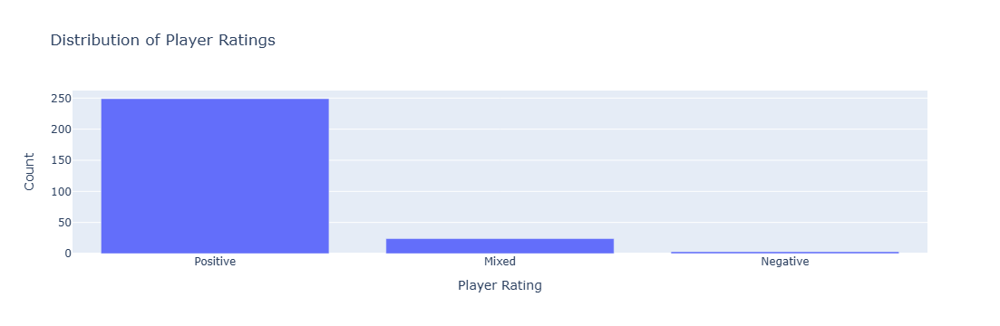

In [4]:
rating_counts = df['overall_player_rating'].value_counts()

fig = px.bar(
    x=rating_counts.index,
    y=rating_counts.values,
    labels={"x": "Player Rating", "y": "Count"},
    title="Distribution of Player Ratings"
)
fig.update_layout(xaxis_title="Player Rating", yaxis_title="Count")
fig.show()

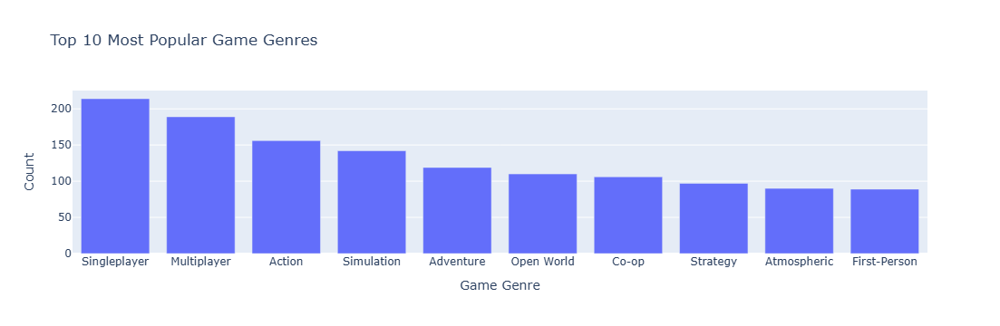

In [5]:
all_genres = [genre for sublist in df['genres'] for genre in sublist]
genres_count = pd.Series(all_genres).value_counts().nlargest(10)

fig = px.bar(
    x=genres_count.index,
    y=genres_count.values,
    labels={"x": "Game Genre", "y": "Count"},
    title="Top 10 Most Popular Game Genres"
)
fig.update_layout(xaxis_title="Game Genre", yaxis_title="Count")
fig.show()

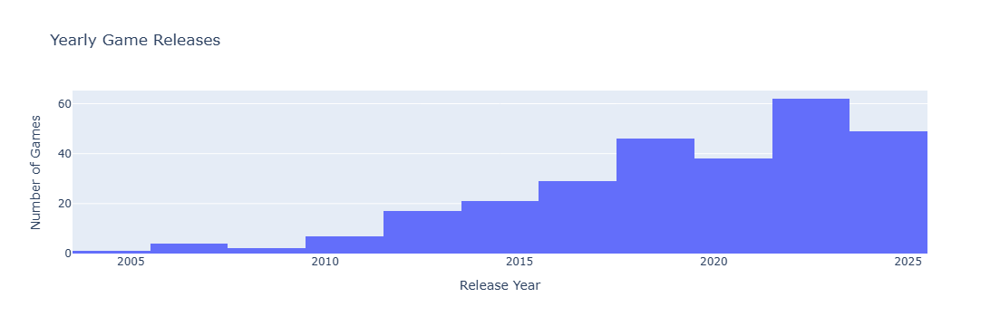

In [6]:
df['release_year'] = df['release_date'].dt.year

fig = px.histogram(
    df, 
    x="release_year", 
    title="Yearly Game Releases",
    labels={"release_year": "Year", "count": "Number of Games"},
    nbins=len(df['release_year'].dropna().unique())
)
fig.update_layout(xaxis_title="Release Year", yaxis_title="Number of Games")
fig.show()

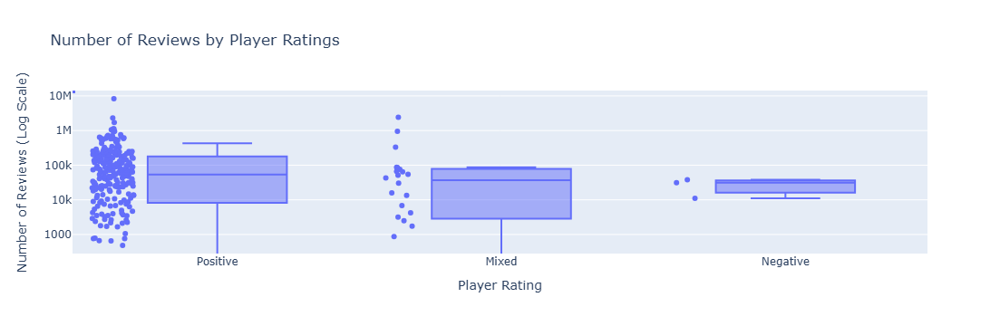

In [7]:
fig = px.box(
    df,
    x="overall_player_rating",
    y="number_of_reviews_from_purchased_people",
    points="all",
    title="Number of Reviews by Player Ratings",
    labels={"overall_player_rating": "Player Rating", "number_of_reviews_from_purchased_people": "Number of Reviews"}
)
fig.update_layout(yaxis_type="log", xaxis_title="Player Rating", yaxis_title="Number of Reviews (Log Scale)")
fig.show()

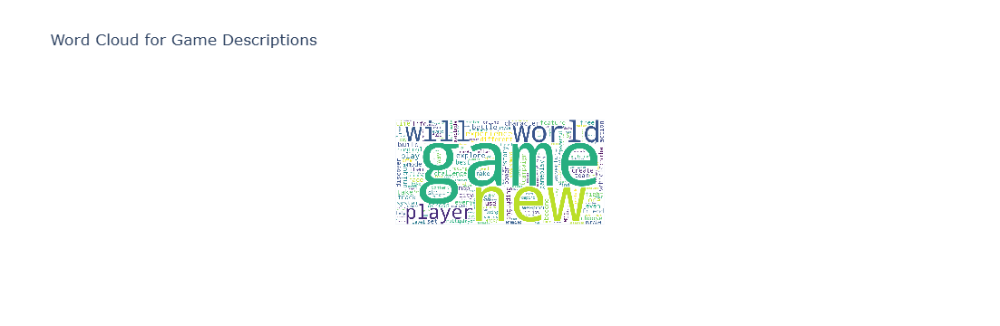

In [8]:
text = " ".join(df['description'].fillna(""))
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(text)

fig = px.imshow(wordcloud, title="Word Cloud for Game Descriptions")
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)
fig.show()

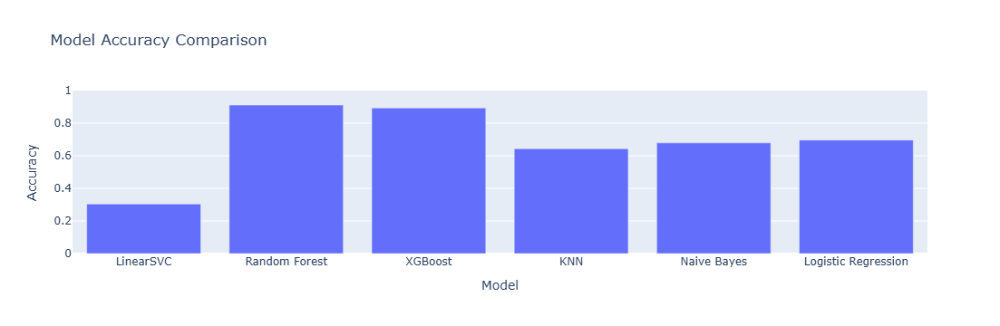

In [9]:
model_names = ["LinearSVC", "Random Forest", "XGBoost", "KNN", "Naive Bayes", "Logistic Regression"]
accuracies = [accuracy_svm, accuracy_rf, accuracy_xgb, accuracy_knn, accuracy_nb, accuracy_lr]

fig = px.bar(
    x=model_names,
    y=accuracies,
    labels={"x": "Model", "y": "Accuracy"},
    title="Model Accuracy Comparison"
)
fig.update_layout(xaxis_title="Model", yaxis_title="Accuracy", yaxis_range=[0, 1])
fig.show()

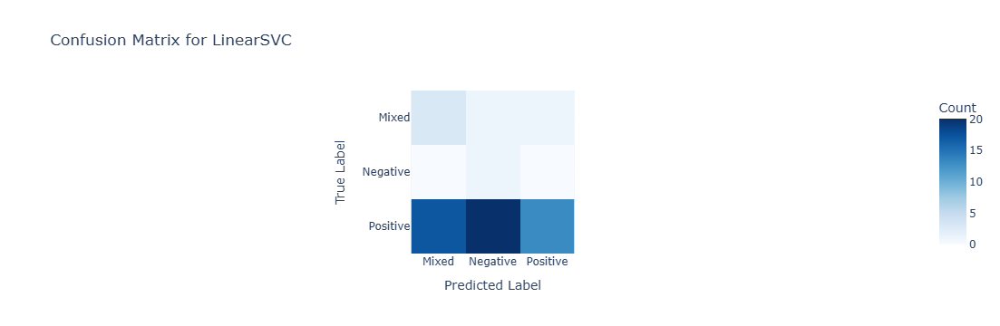

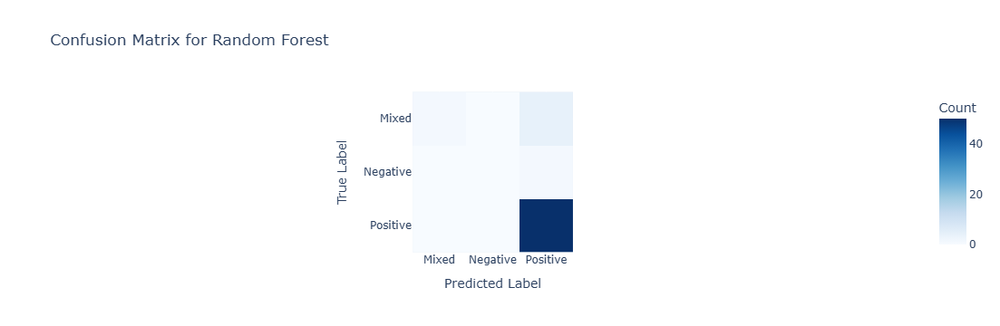

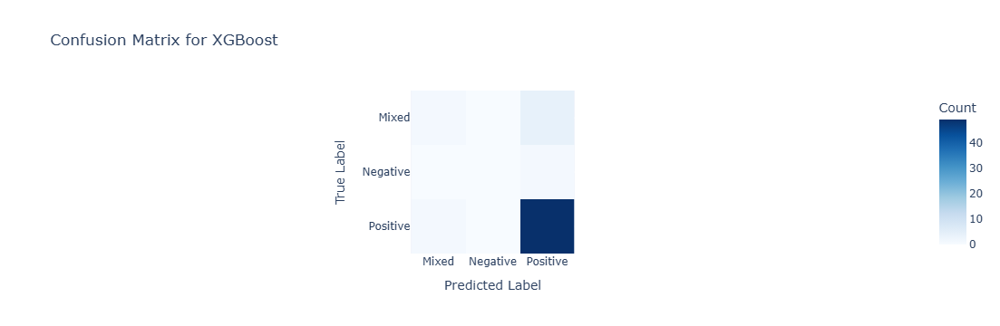

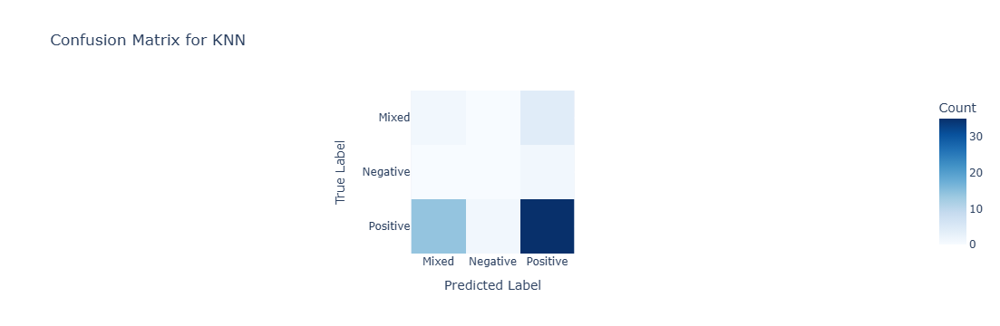

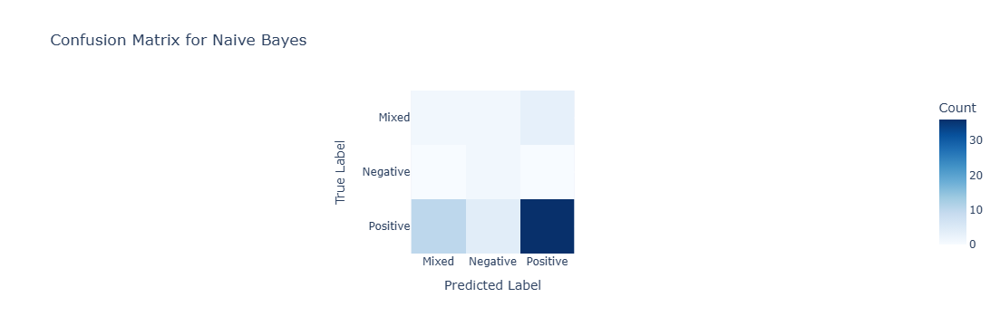

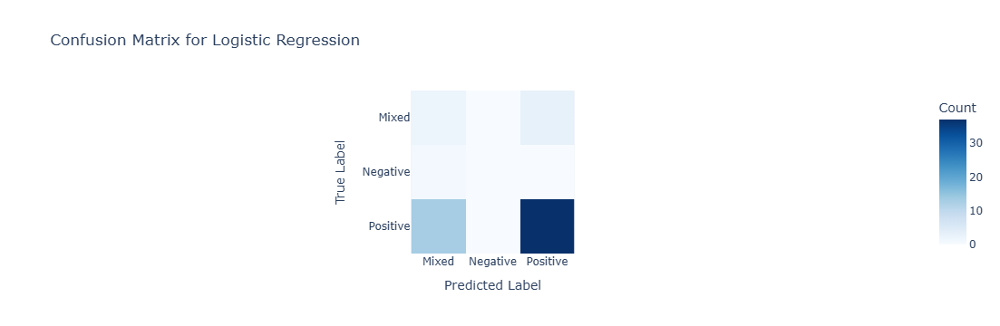

In [10]:
def plot_interactive_confusion_matrix(y_true, y_pred, model_name):
    cm = confusion_matrix(y_true, y_pred)
    labels = le_rating.classes_
    
    fig = px.imshow(
        cm,
        labels=dict(x="Predicted", y="True", color="Count"),
        x=labels,
        y=labels,
        title=f"Confusion Matrix for {model_name}",
        color_continuous_scale="Blues"
    )
    fig.update_layout(xaxis_title="Predicted Label", yaxis_title="True Label")
    fig.show()

plot_interactive_confusion_matrix(y_test, y_pred_svm, "LinearSVC")
plot_interactive_confusion_matrix(y_test, y_pred_rf, "Random Forest")
plot_interactive_confusion_matrix(y_test, y_pred_xgb, "XGBoost")
plot_interactive_confusion_matrix(y_test, y_pred_knn, "KNN")
plot_interactive_confusion_matrix(y_test, y_pred_nb, "Naive Bayes")
plot_interactive_confusion_matrix(y_test, y_pred_lr, "Logistic Regression")

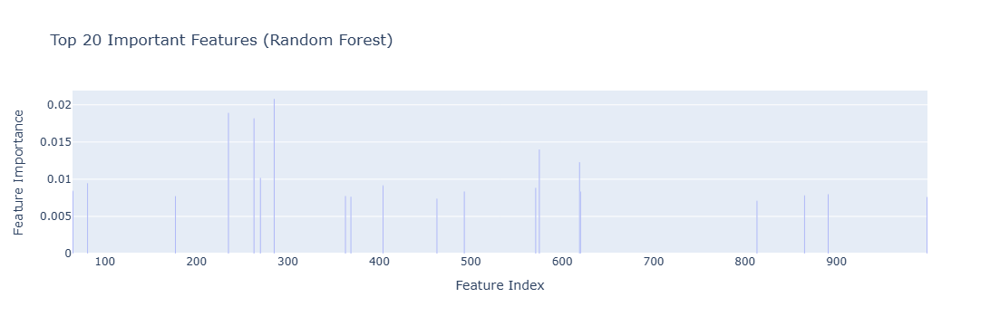

In [11]:
rf_importances = rf_model.feature_importances_
top_rf_features = np.argsort(rf_importances)[-20:][::-1]

fig = px.bar(
    x=top_rf_features,
    y=rf_importances[top_rf_features],
    labels={"x": "Feature Index", "y": "Importance"},
    title="Top 20 Important Features (Random Forest)"
)
fig.update_layout(xaxis_title="Feature Index", yaxis_title="Feature Importance")
fig.show()

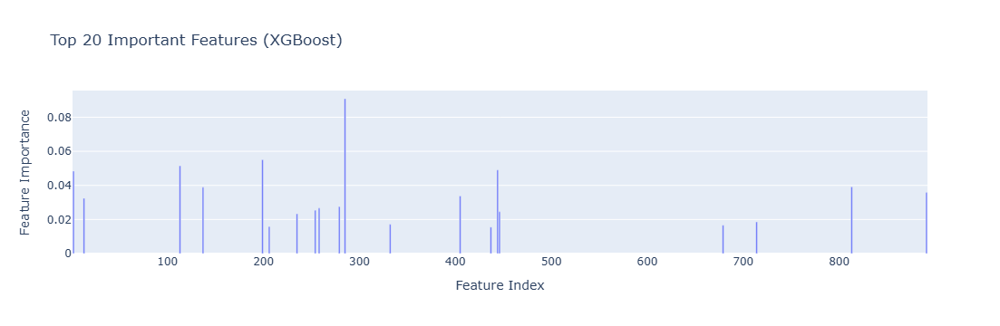

In [12]:
xgb_importances = xgb_model.feature_importances_
top_xgb_features = np.argsort(xgb_importances)[-20:][::-1]

fig = px.bar(
    x=top_xgb_features,
    y=xgb_importances[top_xgb_features],
    labels={"x": "Feature Index", "y": "Importance"},
    title="Top 20 Important Features (XGBoost)"
)
fig.update_layout(xaxis_title="Feature Index", yaxis_title="Feature Importance")
fig.show()

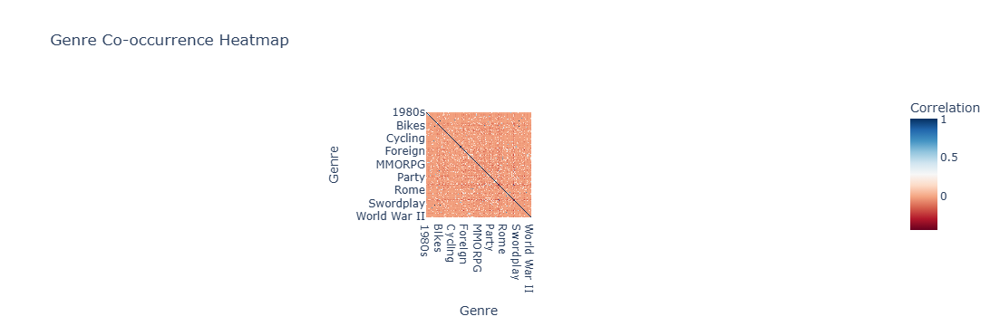

In [13]:
genres_matrix = pd.DataFrame(genres_encoded, columns=mlb.classes_)
genre_corr = genres_matrix.corr()

fig = px.imshow(
    genre_corr,
    labels=dict(x="Genre", y="Genre", color="Correlation"),
    title="Genre Co-occurrence Heatmap",
    color_continuous_scale="RdBu"
)
fig.update_layout(xaxis_title="Genre", yaxis_title="Genre")
fig.show()

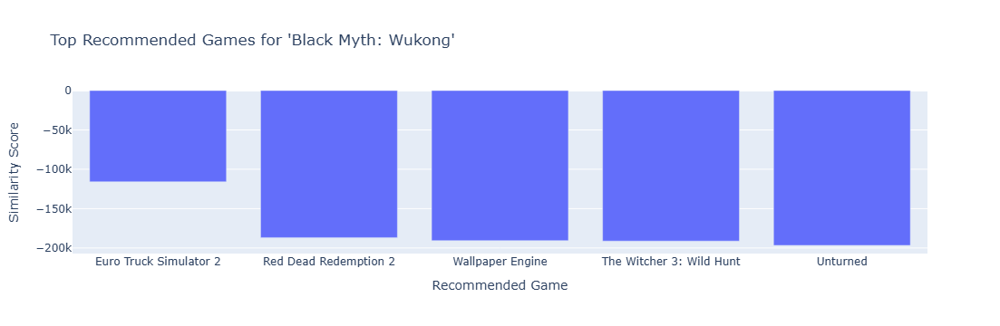

In [14]:
def recommend_games_visual(game_name, df, model, vectorizer, mlb_genres, svd_model):
    idx_list = df.index[df['name'] == game_name].tolist()
    if not idx_list:
        print("Game not found.")
        return
    idx = idx_list[0]
    description = df.iloc[idx]['description']
    text_feature = vectorizer.transform([description])
    genres = df.iloc[idx]['genres']
    genres_feature = mlb_genres.transform([genres])
    numeric_feature = df.iloc[idx][['number_of_reviews_from_purchased_people', 'number_of_english_reviews']].fillna(0).values.reshape(1, -1)
    game_features = hstack([text_feature, genres_feature, numeric_feature])
    game_features_reduced = svd_model.transform(game_features)
    distances, indices = model.kneighbors(game_features_reduced)

    recommendations = []
    for i in indices[0][1:]:
        game = df.iloc[i]
        recommendations.append(game['name'])
    
    fig = px.bar(
        x=recommendations,
        y=1 - distances[0][1:],
        labels={"x": "Recommended Game", "y": "Similarity Score"},
        title=f"Top Recommended Games for '{game_name}'"
    )
    fig.update_layout(xaxis_title="Recommended Game", yaxis_title="Similarity Score")
    fig.show()

recommend_games_visual('Black Myth: Wukong', df, nn_model, tfidf, mlb, svd)

In [15]:
import pandas as pd
import numpy as np
import re
from datetime import datetime
import ast
from collections import Counter
from scipy.sparse import hstack

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MultiLabelBinarizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import classification_report, accuracy_score
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
import xgboost as xgb
from sklearn.feature_selection import SelectKBest, chi2
from imblearn.over_sampling import RandomOverSampler

import warnings
warnings.filterwarnings('ignore')

dtypes = {
    'name': 'category',
    'short_description': 'string',
    'long_description': 'string',
    'genres': 'string',
    'minimum_system_requirement': 'string',
    'recommend_system_requirement': 'string',
    'release_date': 'string',
    'developer': 'string',
    'publisher': 'string',
    'overall_player_rating': 'string',
    'number_of_reviews_from_purchased_people': 'string',
    'number_of_english_reviews': 'string',
    'link': 'string'
}

df = pd.read_csv('steam5.csv', dtype=dtypes, low_memory=True)

def parse_list_field(field):
    try:
        return ast.literal_eval(field)
    except (ValueError, SyntaxError):
        return []

df['genres'] = df['genres'].apply(parse_list_field)
df['developer'] = df['developer'].apply(parse_list_field)
df['publisher'] = df['publisher'].apply(parse_list_field)

def parse_number_field(x):
    if pd.isnull(x):
        return 0
    x = re.sub(r'[\(\),]', '', x)
    x = x.replace(',', '')
    try:
        return int(x)
    except ValueError:
        return 0

df['number_of_reviews_from_purchased_people'] = df['number_of_reviews_from_purchased_people'].apply(parse_number_field)
df['number_of_english_reviews'] = df['number_of_english_reviews'].apply(parse_number_field)

def parse_date(date_str):
    try:
        return datetime.strptime(date_str, '%d %b, %Y')
    except ValueError:
        try:
            return datetime.strptime(date_str, '%b %Y')
        except ValueError:
            return pd.NaT

df['release_date'] = df['release_date'].apply(parse_date)

valid_ratings = [
    'Overwhelmingly Positive', 'Very Positive', 'Mostly Positive', 'Positive',
    'Mixed', 'Negative', 'Mostly Negative', 'Very Negative', 'Overwhelmingly Negative'
]
df = df[df['overall_player_rating'].isin(valid_ratings)]

rating_mapping = {
    'Overwhelmingly Positive': 'Positive',
    'Very Positive': 'Positive',
    'Mostly Positive': 'Positive',
    'Positive': 'Positive',
    'Mixed': 'Mixed',
    'Mostly Negative': 'Negative',
    'Negative': 'Negative',
    'Very Negative': 'Negative',
    'Overwhelmingly Negative': 'Negative'
}

df['overall_player_rating'] = df['overall_player_rating'].map(rating_mapping)

class_counts = df['overall_player_rating'].value_counts()
print("Merged class distribution:")
print(class_counts)

le_rating = LabelEncoder()
df['overall_player_rating_encoded'] = le_rating.fit_transform(df['overall_player_rating'])
print("Encoded classes:", le_rating.classes_)

df['description'] = df['short_description'].fillna('') + ' ' + df['long_description'].fillna('')

max_tfidf_features = 5000 
tfidf = TfidfVectorizer(max_features=max_tfidf_features, stop_words='english', ngram_range=(1, 2))
text_features = tfidf.fit_transform(df['description'])

mlb_genres = MultiLabelBinarizer()
genres_encoded = mlb_genres.fit_transform(df['genres'])

mlb_developers = MultiLabelBinarizer()
developers_encoded = mlb_developers.fit_transform(df['developer'])

mlb_publishers = MultiLabelBinarizer()
publishers_encoded = mlb_publishers.fit_transform(df['publisher'])

numeric_features = df[['number_of_reviews_from_purchased_people', 'number_of_english_reviews']].fillna(0)

final_features = hstack([text_features, genres_encoded, developers_encoded, publishers_encoded, numeric_features])

X = final_features
y = df['overall_player_rating_encoded']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

counter = Counter(y_train)
print("Class distribution in training set:", counter)

ros = RandomOverSampler(random_state=42)
X_train_resampled, y_train_resampled = ros.fit_resample(X_train, y_train)

k_best_features = 1000  
selector = SelectKBest(chi2, k=k_best_features)
X_train_selected = selector.fit_transform(X_train_resampled, y_train_resampled)
X_test_selected = selector.transform(X_test)

rf_model = RandomForestClassifier(n_estimators=200, random_state=42, class_weight='balanced', n_jobs=-1)
rf_model.fit(X_train_selected, y_train_resampled)
y_pred_rf = rf_model.predict(X_test_selected)

print("Random Forest Model Evaluation:")
print(classification_report(y_test, y_pred_rf, target_names=le_rating.classes_, zero_division=0))

def recommend_games_rf(genres_list, developer_list, publisher_list, df, model, vectorizer, 
                       mlb_genres, mlb_developers, mlb_publishers, selector):
    mask = np.ones(len(df), dtype=bool)
    if genres_list:
        genres_mask = df['genres'].apply(lambda x: any(genre in x for genre in genres_list))
        mask = mask & genres_mask
    if developer_list:
        dev_mask = df['developer'].apply(lambda x: any(dev in x for dev in developer_list))
        mask = mask & dev_mask
    if publisher_list:
        pub_mask = df['publisher'].apply(lambda x: any(pub in x for pub in publisher_list))
        mask = mask & pub_mask
    
    filtered_df = df[mask]
    
    if filtered_df.empty:
        print("No games found with the specified criteria.")
        return
    descriptions = filtered_df['description']
    text_features = vectorizer.transform(descriptions)
    genres_features = mlb_genres.transform(filtered_df['genres'])
    developers_features = mlb_developers.transform(filtered_df['developer'])
    publishers_features = mlb_publishers.transform(filtered_df['publisher'])
    numeric_features = filtered_df[['number_of_reviews_from_purchased_people', 'number_of_english_reviews']].fillna(0)
    
    game_features = hstack([text_features, genres_features, developers_features, publishers_features, numeric_features])
    game_features_selected = selector.transform(game_features)
    
    predicted_ratings = model.predict(game_features_selected)
    filtered_df['predicted_rating'] = predicted_ratings
    
    filtered_df['predicted_rating_label'] = le_rating.inverse_transform(predicted_ratings)
    
    recommended_games = filtered_df.sort_values(
        ['predicted_rating', 'number_of_reviews_from_purchased_people'], 
        ascending=[False, False]
    )
    
    print("Recommended Games:")
    for idx, row in recommended_games.head(10).iterrows():
        print(f"Name: {row['name']}")
        print(f"Predicted Rating: {row['predicted_rating_label']}")
        print(f"Genres: {', '.join(row['genres'])}")
        print(f"Developer: {', '.join(row['developer'])}")
        print(f"Publisher: {', '.join(row['publisher'])}")
        print(f"Number of Reviews: {row['number_of_reviews_from_purchased_people']}")
        print("-" * 40)


user_genres = ['Action', 'Adventure']
user_developers = ['Valve']
user_publishers = []

recommend_games_rf(
    genres_list=user_genres,
    developer_list=user_developers,
    publisher_list=user_publishers,
    df=df,
    model=rf_model,
    vectorizer=tfidf,
    mlb_genres=mlb_genres,
    mlb_developers=mlb_developers,
    mlb_publishers=mlb_publishers,
    selector=selector
)

Merged class distribution:
overall_player_rating
Positive    249
Mixed        24
Negative      3
Name: count, dtype: int64
Encoded classes: ['Mixed' 'Negative' 'Positive']
Class distribution in training set: Counter({2: 199, 0: 19, 1: 2})
Random Forest Model Evaluation:
              precision    recall  f1-score   support

       Mixed       1.00      0.20      0.33         5
    Negative       0.00      0.00      0.00         1
    Positive       0.91      1.00      0.95        50

    accuracy                           0.91        56
   macro avg       0.64      0.40      0.43        56
weighted avg       0.90      0.91      0.88        56

Recommended Games:
Name: Counter-Strike 2
Predicted Rating: Positive
Genres: FPS, Shooter, Multiplayer, Competitive, Action, Team-Based, eSports, Tactical, First-Person, PvP, Online Co-Op, Co-op, Strategy, Military, War, Difficult, Trading, Realistic, Fast-Paced, Moddable
Developer: Valve
Publisher: Valve
Number of Reviews: 8313603
--------------

MSE: 197.11
R²: -0.01
MAE: 11.26
MAPE: 0.16


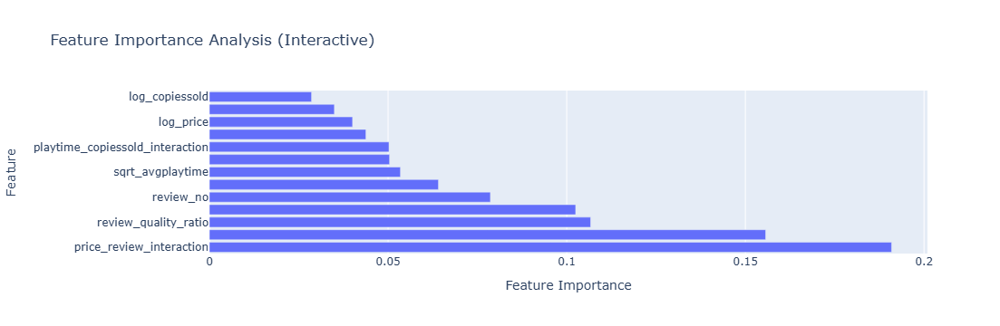

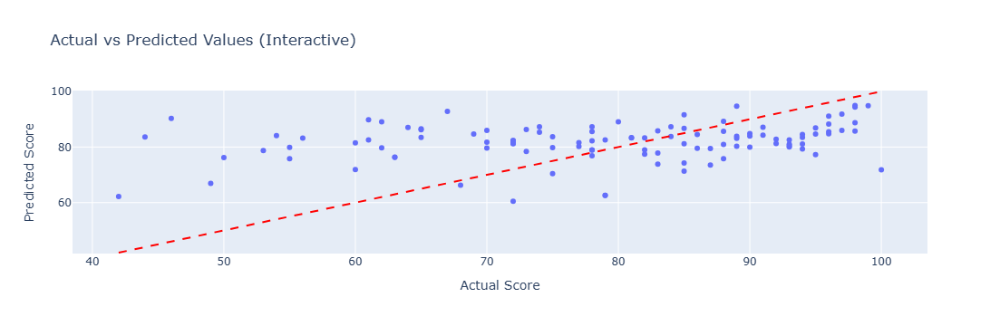

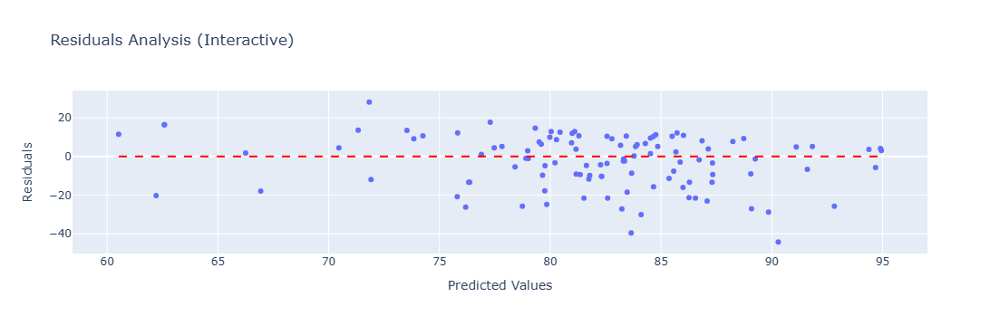

In [7]:
import pandas as pd
import numpy as np
import warnings
import plotly.express as px
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.preprocessing import RobustScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
warnings.filterwarnings('ignore')

def advanced_feature_engineering(df):
    data = df[['avgplaytime', 'copiessold', 'review_no', 'price_x', 'reviewscore']]
    data = data.dropna()
    
    data['total_engagement'] = data['avgplaytime'] * data['copiessold']
    data['review_density'] = data['review_no'] / (data['copiessold'] + 1)
    data['review_quality_ratio'] = data['reviewscore'] / (data['review_no'] + 1)
    data['price_playtime_ratio'] = data['price_x'] / (data['avgplaytime'] + 1)
    data['sqrt_avgplaytime'] = np.sqrt(data['avgplaytime'])
    data['log_price'] = np.log1p(data['price_x'])
    data['log_copiessold'] = np.log1p(data['copiessold'])
    
    data['price_review_interaction'] = data['price_x'] * data['review_no']
    data['playtime_copiessold_interaction'] = data['avgplaytime'] * data['copiessold']
    
    return data

def remove_outliers(X, y):
    Q1 = np.percentile(y, 25)
    Q3 = np.percentile(y, 75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    mask = (y >= lower_bound) & (y <= upper_bound)
    return X[mask], y[mask]

df = pd.read_csv('s1.csv')
data = advanced_feature_engineering(df)

features = [
    'avgplaytime', 'copiessold', 'review_no', 'price_x', 
    'total_engagement', 'review_density', 'review_quality_ratio', 
    'price_playtime_ratio', 'sqrt_avgplaytime', 'log_price', 
    'log_copiessold', 'price_review_interaction', 
    'playtime_copiessold_interaction'
]

X = data[features]
y = data['reviewscore']
X, y = remove_outliers(X, y)

scaler = RobustScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

rf_model = RandomForestRegressor(random_state=42, n_estimators=100)
rf_model.fit(X_train, y_train)
y_pred_best = rf_model.predict(X_test)

mse = mean_squared_error(y_test, y_pred_best)
r2 = r2_score(y_test, y_pred_best)
mae = mean_absolute_error(y_test, y_pred_best)
mape = mean_absolute_percentage_error(y_test, y_pred_best)

print(f"MSE: {mse:.2f}")
print(f"R²: {r2:.2f}")
print(f"MAE: {mae:.2f}")
print(f"MAPE: {mape:.2f}")

# Feature Importance Plot
importances = rf_model.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': features, 
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

fig_feature_importance = px.bar(
    feature_importance_df,
    x='Importance',
    y='Feature',
    orientation='h',
    title='Feature Importance Analysis (Interactive)',
    labels={'Importance': 'Feature Importance', 'Feature': 'Feature'},
)
fig_feature_importance.show()

# Actual vs Predicted Plot
fig_actual_vs_predicted = px.scatter(
    x=y_test,
    y=y_pred_best,
    labels={'x': 'Actual Score', 'y': 'Predicted Score'},
    title='Actual vs Predicted Values (Interactive)',
)
fig_actual_vs_predicted.add_shape(
    type='line',
    x0=min(y_test.min(), y_pred_best.min()),
    x1=max(y_test.max(), y_pred_best.max()),
    y0=min(y_test.min(), y_pred_best.min()),
    y1=max(y_test.max(), y_pred_best.max()),
    line=dict(color='Red', dash='dash'),
)
fig_actual_vs_predicted.show()

# Residuals Plot
residuals = y_test - y_pred_best
fig_residuals = px.scatter(
    x=y_pred_best,
    y=residuals,
    labels={'x': 'Predicted Values', 'y': 'Residuals'},
    title='Residuals Analysis (Interactive)',
)
fig_residuals.add_shape(
    type='line',
    x0=y_pred_best.min(),
    x1=y_pred_best.max(),
    y0=0,
    y1=0,
    line=dict(color='Red', dash='dash'),
)
fig_residuals.show()